In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from skimage import io, img_as_float, img_as_ubyte
from skimage import exposure
from skimage import util
from skimage import filters
from skimage.filters.rank import median
from skimage.filters.rank import mean
from skimage.color import rgb2gray
from skimage.color import rgb2yuv
from skimage.morphology import disk, ball
from skimage.exposure import is_low_contrast


matplotlib.rcParams['font.size'] = 8

In [2]:
def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

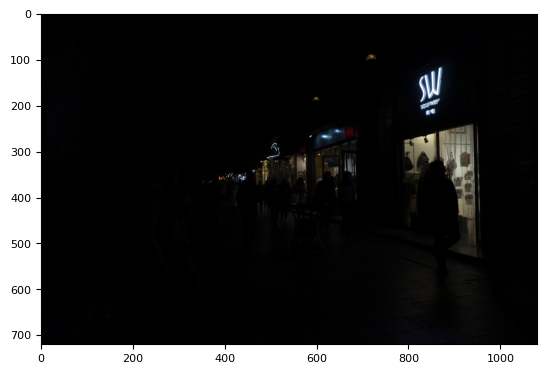

In [3]:
# Load an example image
img33 = img_as_float(io.imread("33.png"))
img333 = img_as_float(io.imread("333.png"))
img77 = img_as_float(io.imread("77.png"))
img777 = img_as_float(io.imread("777.png"))

#image2 = io.imread("images/test_image.jpg").astype(np.float)
#avoid using astype as it violates assumptions about dtype range.
#for example float should range from 0 to 1 (or -1 to 1) but if you use
#astype to convert to float, the values do not lie between 0 and 1.
plt.imshow(img33)

In [4]:
img33.shape

(720, 1080, 3)

# FUNCIONES DE TRANSFORMACIÓN O AJUSTE DE LA INTENSIDAD

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


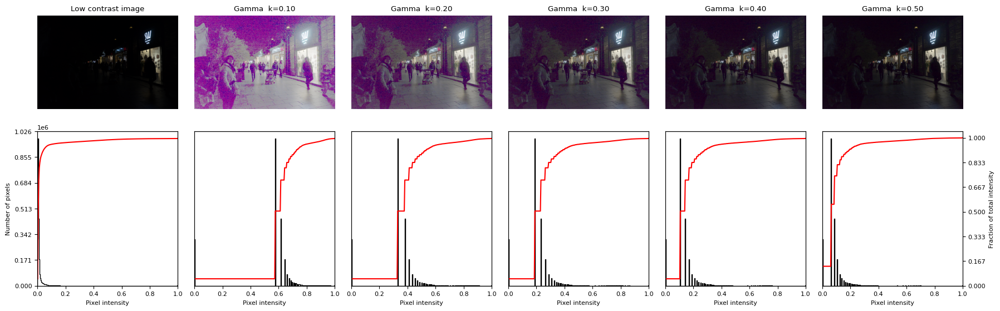

In [6]:
# Gamma (0.10)
gamma_corrected_01 = exposure.adjust_gamma(img33, 0.10)

# Gamma (0.20)
gamma_corrected_02 = exposure.adjust_gamma(img33, 0.20)

# Gamma (0.30)
gamma_corrected_03 = exposure.adjust_gamma(img33, 0.30)

# Gamma (0.40)
gamma_corrected_04 = exposure.adjust_gamma(img33, 0.40)

# Gamma (0.50)
gamma_corrected_05 = exposure.adjust_gamma(img33, 0.50)

# Display results
fig = plt.figure(figsize=(18, 6))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 7))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected_01, axes[:, 1])
ax_img.set_title('Gamma  k=0.10')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected_02, axes[:, 2])
ax_img.set_title('Gamma  k=0.20')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected_03, axes[:, 3])
ax_img.set_title('Gamma  k=0.30')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected_04, axes[:, 4])
ax_img.set_title('Gamma  k=0.40')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected_05, axes[:, 5])
ax_img.set_title('Gamma  k=0.50')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 7))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

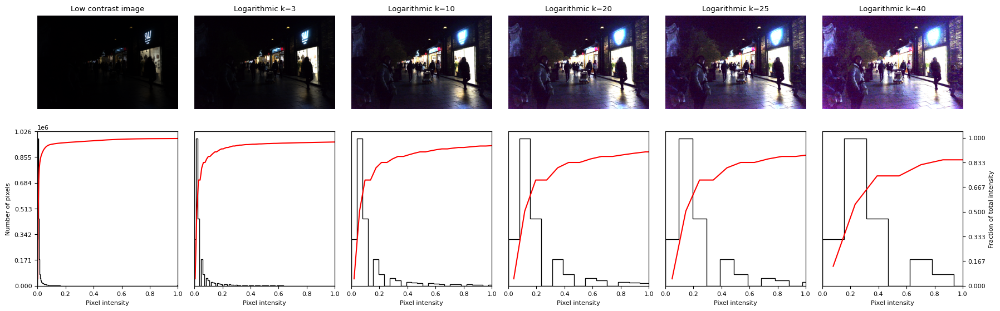

In [7]:
# Logarithmic (k=3)
logarithmic_corrected_3 = exposure.adjust_log(img33, 3)

# Logarithmic (k=10)
logarithmic_corrected_10 = exposure.adjust_log(img33, 10)

# Logarithmic (k=20)
logarithmic_corrected_20 = exposure.adjust_log(img33, 20)

# Logarithmic (k=25)
logarithmic_corrected_25 = exposure.adjust_log(img33, 25)

# Logarithmic (k=40)
logarithmic_corrected_40 = exposure.adjust_log(img33, 40)

# Display results
fig = plt.figure(figsize=(18, 6))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 7))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected_3, axes[:, 1])
ax_img.set_title('Logarithmic k=3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected_10, axes[:, 2])
ax_img.set_title('Logarithmic k=10')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected_20, axes[:, 3])
ax_img.set_title('Logarithmic k=20')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected_25, axes[:, 4])
ax_img.set_title('Logarithmic k=25')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected_40, axes[:, 5])
ax_img.set_title('Logarithmic k=40')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 7))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

### **Los mejores resultados para las funciones Gamma y Log son:**

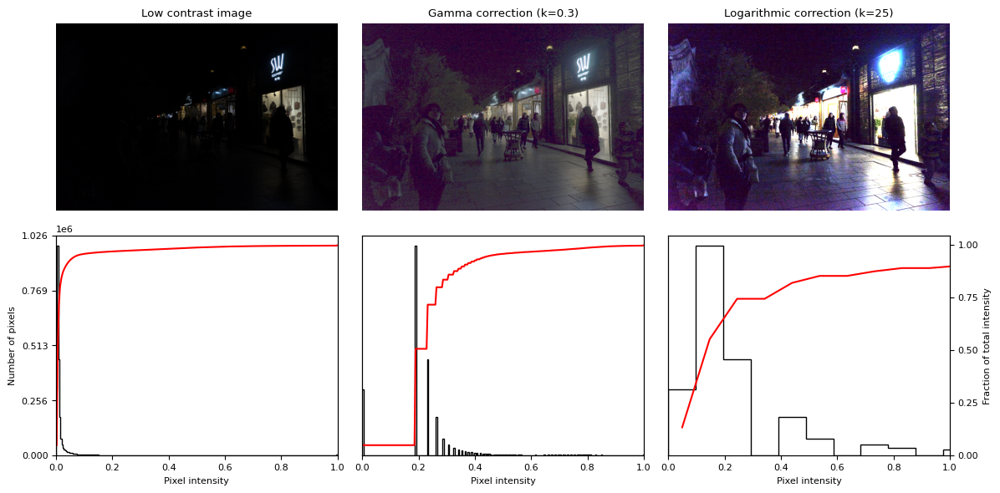

In [8]:
# Gamma
gamma_corrected = exposure.adjust_gamma(img33, 0.3)

# Logarithmic
logarithmic_corrected = exposure.adjust_log(img33, 25)

# Display results
fig = plt.figure(figsize=(12, 6))
axes = np.zeros((2, 3), dtype=object)
axes[0, 0] = plt.subplot(2, 3, 1)
axes[0, 1] = plt.subplot(2, 3, 2, sharex=axes[0, 0], sharey=axes[0, 0])
axes[0, 2] = plt.subplot(2, 3, 3, sharex=axes[0, 0], sharey=axes[0, 0])
axes[1, 0] = plt.subplot(2, 3, 4)
axes[1, 1] = plt.subplot(2, 3, 5)
axes[1, 2] = plt.subplot(2, 3, 6)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected, axes[:, 1])
ax_img.set_title('Gamma correction (k=0.3)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected, axes[:, 2])
ax_img.set_title('Logarithmic correction (k=25)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

# PROCESAMIENTO DEL HISTOGRAMA

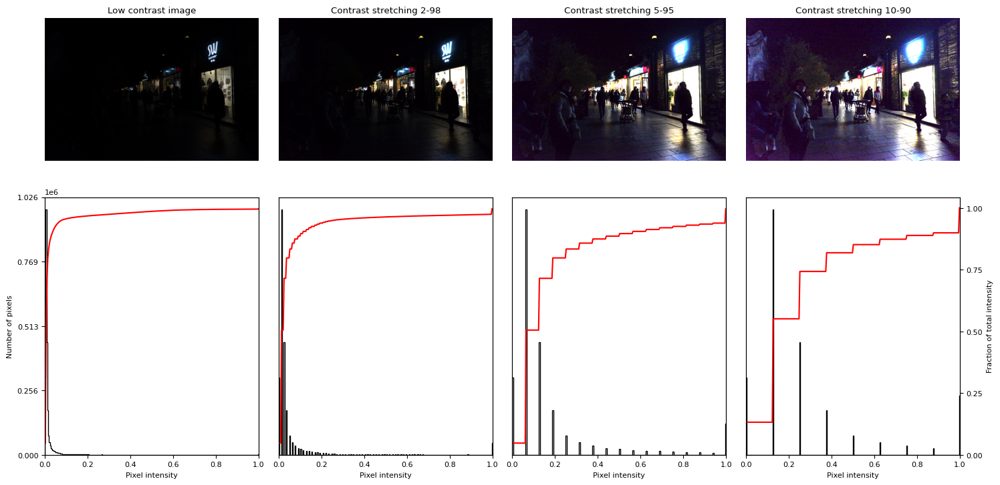

In [9]:
# Contrast stretching
p2, p98 = np.percentile(img33, (2, 98))
img_rescale2_98 = exposure.rescale_intensity(img33, in_range=(p2, p98))

# Contrast stretching
p5, p95 = np.percentile(img33, (5, 95))
img_rescale5_95 = exposure.rescale_intensity(img33, in_range=(p5, p95))

# Contrast stretching
p10, p90 = np.percentile(img33, (10, 90))
img_rescale10_90 = exposure.rescale_intensity(img33, in_range=(p10, p90))

# Display results
fig = plt.figure(figsize=(15, 8))
axes = np.zeros((2, 4), dtype=object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale2_98, axes[:, 1])
ax_img.set_title('Contrast stretching 2-98')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale5_95, axes[:, 2])
ax_img.set_title('Contrast stretching 5-95')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale10_90, axes[:, 3])
ax_img.set_title('Contrast stretching 10-90')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

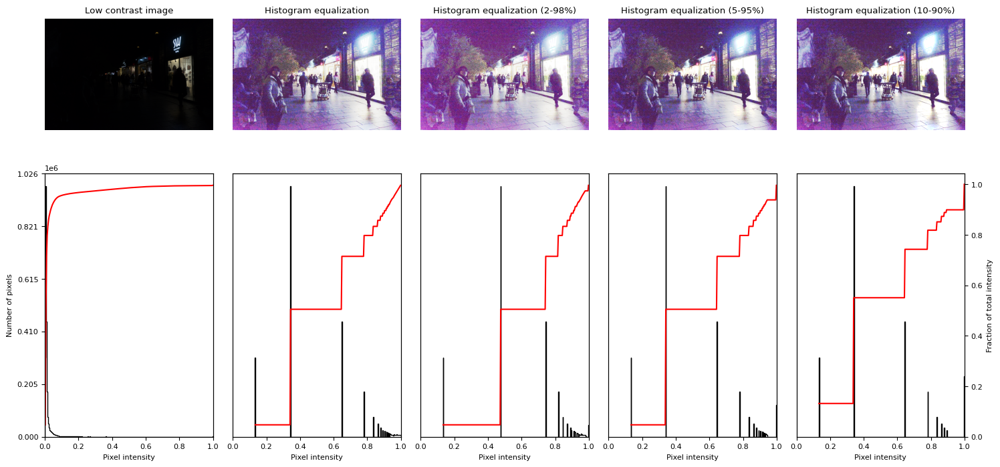

In [10]:
# Equalization
img_eq = exposure.equalize_hist(img33)

# Equalization 2-98
img_eq298 = exposure.equalize_hist(img_rescale2_98)

# Equalization 5-95
img_eq595 = exposure.equalize_hist(img_rescale5_95)

# Equalization 10-90
img_eq1090 = exposure.equalize_hist(img_rescale10_90)

# Display results
fig = plt.figure(figsize=(15, 8))
axes = np.zeros((2, 5), dtype=object)
axes[0, 0] = fig.add_subplot(2, 5, 1)
for i in range(1, 5):
    axes[0, i] = fig.add_subplot(2, 5, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 5):
    axes[1, i] = fig.add_subplot(2, 5, 6+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:, 1])
ax_img.set_title('Histogram equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq298, axes[:, 2])
ax_img.set_title('Histogram equalization (2-98%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq595, axes[:, 3])
ax_img.set_title('Histogram equalization (5-95%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq1090, axes[:, 4])
ax_img.set_title('Histogram equalization (10-90%)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

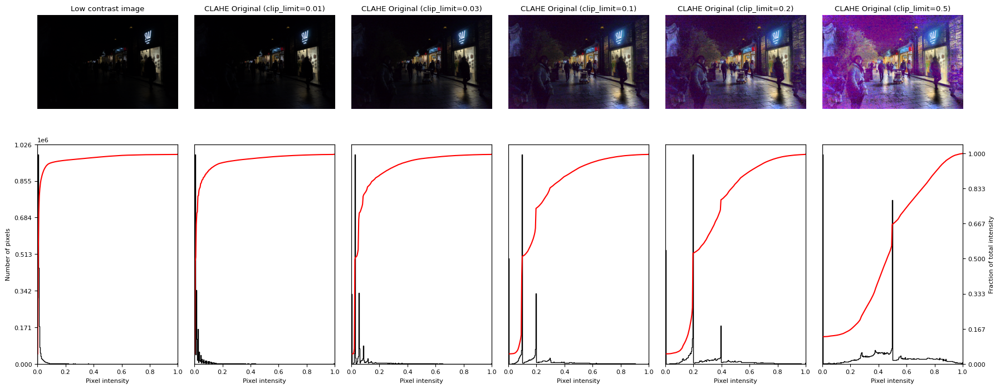

In [11]:
# Adaptive Equalization (clip_limit=0.01)
img33_clahe_001 = exposure.equalize_adapthist(img33, clip_limit=0.01)

# Adaptive Equalization (clip_limit=0.03)
img33_clahe_003 = exposure.equalize_adapthist(img33, clip_limit=0.03)

# Adaptive Equalization (clip_limit=0.1)
img33_clahe_01 = exposure.equalize_adapthist(img33, clip_limit=0.1)

# Adaptive Equalization (clip_limit=0.2)
img33_clahe_02 = exposure.equalize_adapthist(img33, clip_limit=0.2)

# Adaptive Equalization (clip_limit=0.5)
img33_clahe_05 = exposure.equalize_adapthist(img33, clip_limit=0.5)

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 7))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_clahe_001, axes[:, 1])
ax_img.set_title('CLAHE Original (clip_limit=0.01)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_clahe_003, axes[:, 2])
ax_img.set_title('CLAHE Original (clip_limit=0.03)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_clahe_01, axes[:, 3])
ax_img.set_title('CLAHE Original (clip_limit=0.1)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_clahe_02, axes[:, 4])
ax_img.set_title('CLAHE Original (clip_limit=0.2)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_clahe_05, axes[:, 5])
ax_img.set_title('CLAHE Original (clip_limit=0.5)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 7))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

**Nos damos cuenta que el valor para el parámetro clip_limit que mejores resultados arroja es: 0.2**

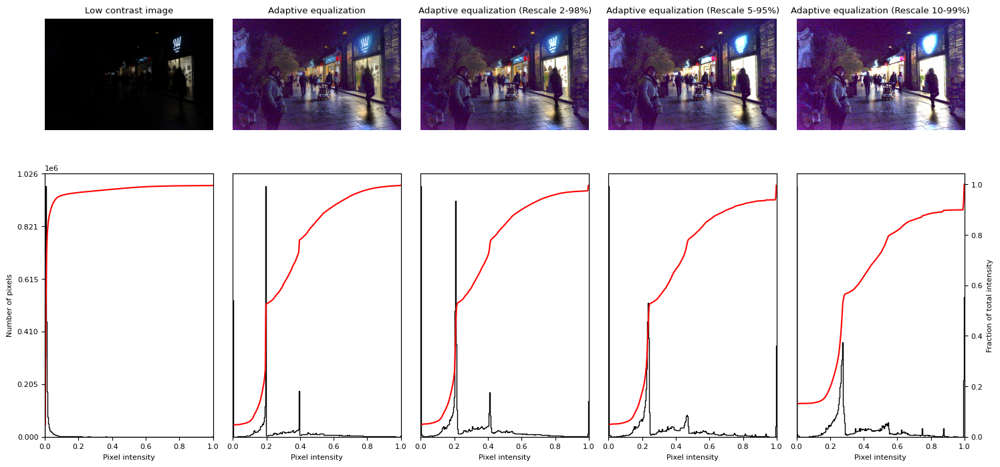

In [12]:
# Adaptive Equalization
img_clahe = exposure.equalize_adapthist(img33, clip_limit=0.2)

# Adaptive Equalization (Rescale 2-98%)
img_clahe_298 = exposure.equalize_adapthist(img_rescale2_98, clip_limit=0.2)

# Adaptive Equalization (Rescale 5-95%)
img_clahe_595 = exposure.equalize_adapthist(img_rescale5_95, clip_limit=0.2)

# Adaptive Equalization (Rescale 10-90%)
img_clahe_1090 = exposure.equalize_adapthist(img_rescale10_90, clip_limit=0.2)

# Display results
fig = plt.figure(figsize=(15, 8))
axes = np.zeros((2, 5), dtype=object)
axes[0, 0] = fig.add_subplot(2, 5, 1)
for i in range(1, 5):
    axes[0, i] = fig.add_subplot(2, 5, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 5):
    axes[1, i] = fig.add_subplot(2, 5, 6+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_clahe, axes[:, 1])
ax_img.set_title('Adaptive equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_clahe_298, axes[:, 2])
ax_img.set_title('Adaptive equalization (Rescale 2-98%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_clahe_595, axes[:, 3])
ax_img.set_title('Adaptive equalization (Rescale 5-95%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_clahe_1090, axes[:, 4])
ax_img.set_title('Adaptive equalization (Rescale 10-99%)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

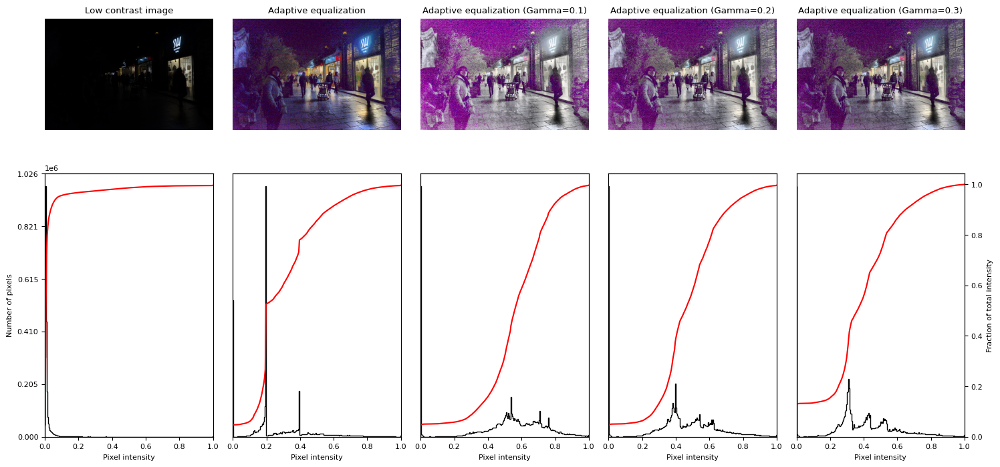

In [13]:
# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(img33, clip_limit=0.2)

# Adaptive Equalization (Gamma=0.1)
img_adapteq_gamma_01 = exposure.equalize_adapthist(gamma_corrected_01, clip_limit=0.2)

# Adaptive Equalization (Gamma=0.2)
img_adapteq_gamma_02 = exposure.equalize_adapthist(gamma_corrected_02, clip_limit=0.2)

# Adaptive Equalization (Gamma=0.3)
img_adapteq_gamma_03 = exposure.equalize_adapthist(gamma_corrected_03, clip_limit=0.2)

# Gamma (0.20)
#gamma_corrected_02 = exposure.adjust_gamma(img33, 0.20)

# Display results
fig = plt.figure(figsize=(15, 8))
axes = np.zeros((2, 5), dtype=object)
axes[0, 0] = fig.add_subplot(2, 5, 1)
for i in range(1, 5):
    axes[0, i] = fig.add_subplot(2, 5, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 5):
    axes[1, i] = fig.add_subplot(2, 5, 6+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 1])
ax_img.set_title('Adaptive equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq_gamma_01, axes[:, 2])
ax_img.set_title('Adaptive equalization (Gamma=0.1)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq_gamma_02, axes[:, 3])
ax_img.set_title('Adaptive equalization (Gamma=0.2)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq_gamma_03, axes[:, 4])
ax_img.set_title('Adaptive equalization (Gamma=0.3)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

### **MEJORES RESULTADOS CON LAS TÉNICAS DE PROCESAMIENTO DEL HISTOGRAMA**

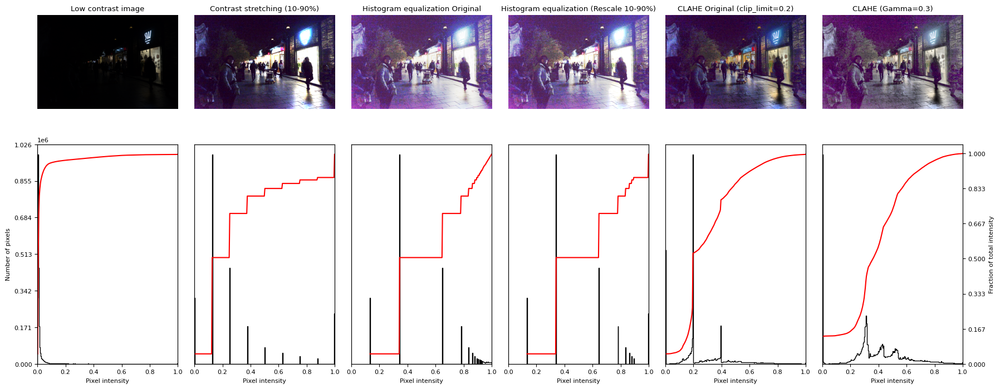

In [14]:
# Contrast stretching
p10, p90 = np.percentile(img33, (10, 90))
img_rescale_1090 = exposure.rescale_intensity(img33, in_range=(p10, p90))

# Equalization Original
img33_eq = exposure.equalize_hist(img33)

# Equalization Rescale
img_rescale_eq_1090 = exposure.equalize_hist(img_rescale_1090)

# Adaptive Equalization Original
img_adapteq = exposure.equalize_adapthist(img33, clip_limit=0.2)

# Adaptive Equalization (Gamma=0.3)
img_adapteq_gamma = exposure.equalize_adapthist(gamma_corrected, clip_limit=0.2)

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 7))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale_1090, axes[:, 1])
ax_img.set_title('Contrast stretching (10-90%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_eq, axes[:, 2])
ax_img.set_title('Histogram equalization Original')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale_eq_1090, axes[:, 3])
ax_img.set_title('Histogram equalization (Rescale 10-90%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 4])
ax_img.set_title('CLAHE Original (clip_limit=0.2)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq_gamma, axes[:, 5])
ax_img.set_title('CLAHE (Gamma=0.3)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 7))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

# OPERACIONES MATEMÁTICAS

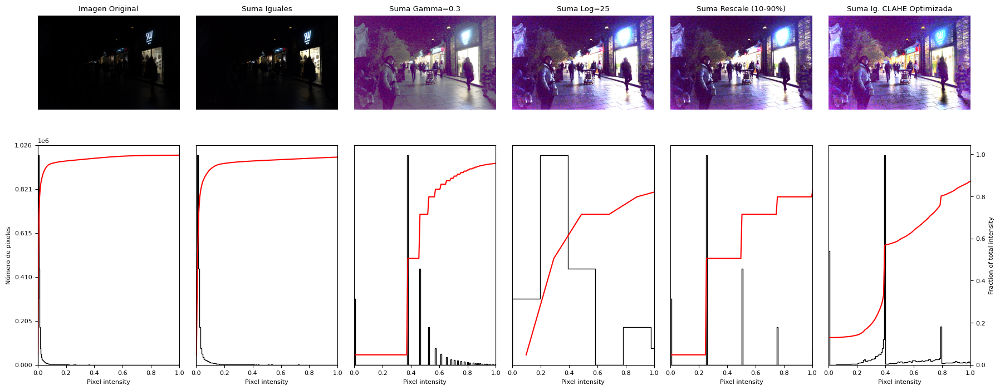

In [15]:
constante = 0.2
k = 2.5

# SUMA BLOQUE 1
img33_add = img33 + img33
img33_add_gamma03 = gamma_corrected_03 + gamma_corrected_03
img33_add_log25 = logarithmic_corrected_25 + logarithmic_corrected_25
img33_add_rescale1090 = img_rescale10_90 + img_rescale10_90
img33_add_adapte_02 = img_adapteq + img_adapteq # Perfecta

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add, axes[:, 1])
ax_img.set_title('Suma Iguales')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_gamma03, axes[:, 2])
ax_img.set_title('Suma Gamma=0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_log25, axes[:, 3])
ax_img.set_title('Suma Log=25')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_rescale1090, axes[:, 4])
ax_img.set_title('Suma Rescale (10-90%)')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapte_02, axes[:, 5])
ax_img.set_title('Suma Ig. CLAHE Optimizada')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

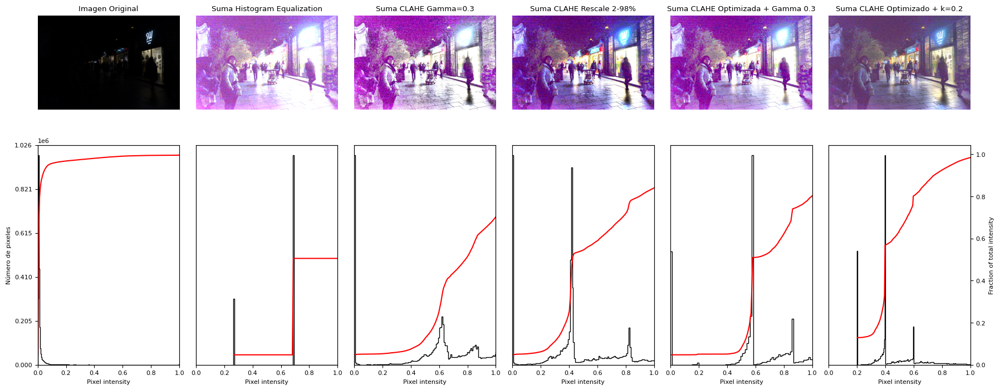

In [16]:
# SUMA BLOQUE 2
img33_add_eq = img_eq + img_eq
img33_add_adapteq_gamma_03 = img_adapteq_gamma_03 + img_adapteq_gamma_03
img33_add_adapteq298 = img_clahe_298 + img_clahe_298
img33_add_adapteq_gamma03 = img_adapteq + img33_add_gamma03
img33_add_clahe_opt_k = img_adapteq + constante

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_eq, axes[:, 1])
ax_img.set_title('Suma Histogram Equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapteq_gamma_03, axes[:, 2])
ax_img.set_title('Suma CLAHE Gamma=0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapteq298, axes[:, 3])
ax_img.set_title('Suma CLAHE Rescale 2-98%')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapteq_gamma03, axes[:, 4])
ax_img.set_title('Suma CLAHE Optimizada + Gamma 0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_clahe_opt_k, axes[:, 5])
ax_img.set_title('Suma CLAHE Optimizado + k=0.2')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

### **MEJORES RESULTADOS CON LAS TÉNICAS DE OPERADORES MATEMÁTICOS (SUMA)**

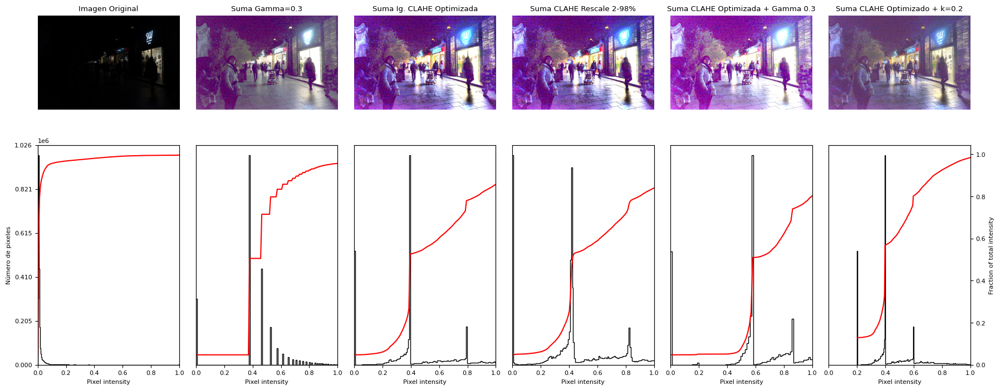

In [17]:
# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_gamma03, axes[:, 1])
ax_img.set_title('Suma Gamma=0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapte_02, axes[:, 2])
ax_img.set_title('Suma Ig. CLAHE Optimizada')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapteq298, axes[:, 3])
ax_img.set_title('Suma CLAHE Rescale 2-98%')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_adapteq_gamma03, axes[:, 4])
ax_img.set_title('Suma CLAHE Optimizada + Gamma 0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_add_clahe_opt_k, axes[:, 5])
ax_img.set_title('Suma CLAHE Optimizado + k=0.2')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

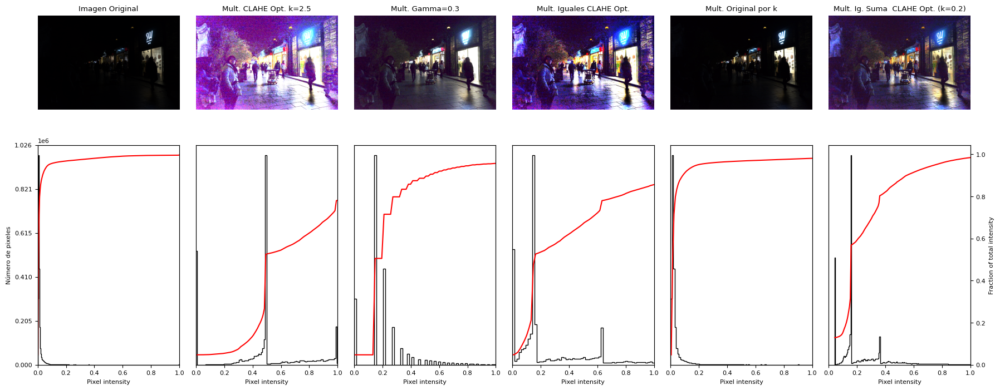

In [18]:
# MULTIPLICACIÓN
k = 2.5
img33_mul_k = img_adapteq * k
img33_mul_gamma03 = img33_add_gamma03 * img33_add_gamma03
img33_mul_adapteq = img33_add_adapte_02 * img33_add_adapte_02
img33_mul_original_k = img33 * k
img33_mul_add_clahe_opt_k = img33_add_clahe_opt_k * img33_add_clahe_opt_k

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_mul_k, axes[:, 1])
ax_img.set_title('Mult. CLAHE Opt. k=2.5')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_mul_gamma03, axes[:, 2])
ax_img.set_title('Mult. Gamma=0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_mul_adapteq, axes[:, 3])
ax_img.set_title('Mult. Iguales CLAHE Opt.')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_mul_original_k, axes[:, 4])
ax_img.set_title('Mult. Original por k')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img33_mul_add_clahe_opt_k, axes[:, 5])
ax_img.set_title('Mult. Ig. Suma  CLAHE Opt. (k=0.2)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

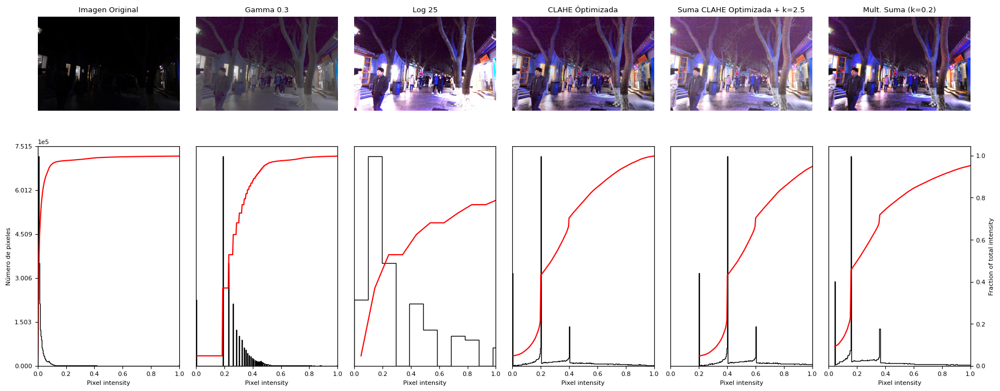

In [21]:
constante = 0.2
k = 2.5

img333_gamma_corrected = exposure.adjust_gamma(img333, 0.3)
img333_logarithmic_corrected = exposure.adjust_log(img333, 25)
img333_adapteq = exposure.equalize_adapthist(img333, clip_limit=0.2)
img333_add_k = img333_adapteq + constante
img333_mul_add_k = img333_add_k * img333_add_k

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333_gamma_corrected, axes[:, 1])
ax_img.set_title('Gamma 0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333_logarithmic_corrected, axes[:, 2])
ax_img.set_title('Log 25')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333_adapteq, axes[:, 3])
ax_img.set_title('CLAHE Óptimizada')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333_add_k, axes[:, 4])
ax_img.set_title('Suma CLAHE Optimizada + k=2.5')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333_mul_add_k, axes[:, 5])
ax_img.set_title('Mult. Suma (k=0.2)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

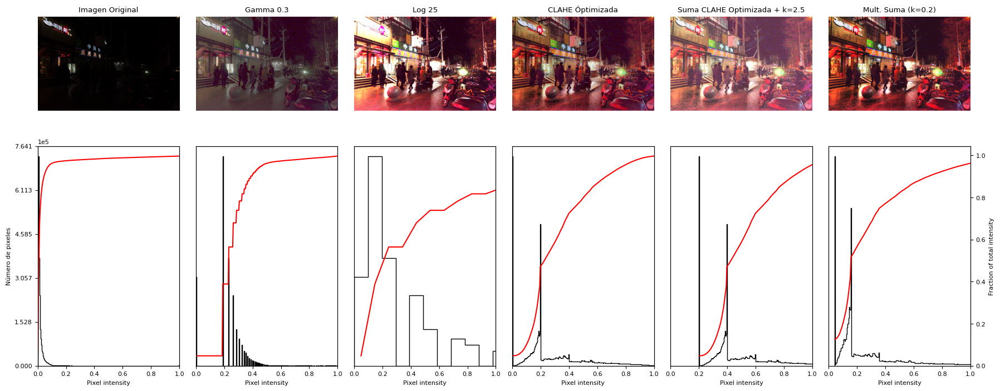

In [23]:
constante = 0.2
k = 2.5

img77_gamma_corrected = exposure.adjust_gamma(img77, 0.3)
img77_logarithmic_corrected = exposure.adjust_log(img77, 25)
img77_adapteq = exposure.equalize_adapthist(img77, clip_limit=0.2)
img77_add_k = img77_adapteq + constante
img77_mul_add_k = img77_add_k * img77_add_k

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77_gamma_corrected, axes[:, 1])
ax_img.set_title('Gamma 0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77_logarithmic_corrected, axes[:, 2])
ax_img.set_title('Log 25')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77_adapteq, axes[:, 3])
ax_img.set_title('CLAHE Óptimizada')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77_add_k, axes[:, 4])
ax_img.set_title('Suma CLAHE Optimizada + k=2.5')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77_mul_add_k, axes[:, 5])
ax_img.set_title('Mult. Suma (k=0.2)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

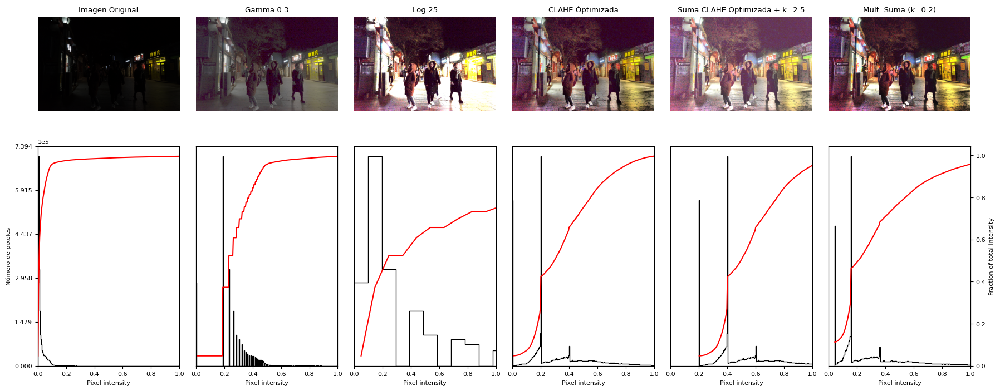

In [25]:
constante = 0.2
k = 2.5

img777_gamma_corrected = exposure.adjust_gamma(img777, 0.3)
img777_logarithmic_corrected = exposure.adjust_log(img777, 25)
img777_adapteq = exposure.equalize_adapthist(img777, clip_limit=0.2)
img777_add_k = img777_adapteq + constante
img777_mul_add_k = img777_add_k * img777_add_k

# Display results
fig = plt.figure(figsize=(18, 8))
axes = np.zeros((2, 6), dtype=object)
axes[0, 0] = fig.add_subplot(2, 6, 1)
for i in range(1, 6):
    axes[0, i] = fig.add_subplot(2, 6, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 6):
    axes[1, i] = fig.add_subplot(2, 6, 7+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777, axes[:, 0])
ax_img.set_title('Imagen Original')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Número de pixeles')
ax_hist.set_yticks(np.linspace(0, y_max, 6))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777_gamma_corrected, axes[:, 1])
ax_img.set_title('Gamma 0.3')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777_logarithmic_corrected, axes[:, 2])
ax_img.set_title('Log 25')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777_adapteq, axes[:, 3])
ax_img.set_title('CLAHE Óptimizada')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777_add_k, axes[:, 4])
ax_img.set_title('Suma CLAHE Optimizada + k=2.5')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777_mul_add_k, axes[:, 5])
ax_img.set_title('Mult. Suma (k=0.2)')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 6))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

**Hemos determinado que las imagenes procesadas con la función CLAHE, produce una imagen de mayor calidad en su nitidez, contraste y luminosidad**

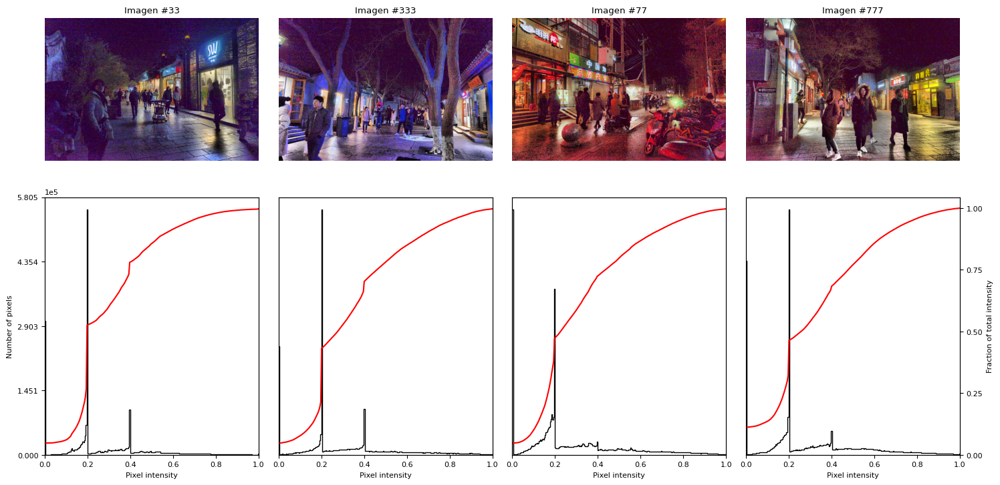

In [27]:

# Display results
fig = plt.figure(figsize=(20, 8))
axes = np.zeros((2, 4), dtype=object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 0])
ax_img.set_title('Imagen #33')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img333_adapteq, axes[:, 1])
ax_img.set_title('Imagen #333')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img77_adapteq, axes[:, 2])
ax_img.set_title('Imagen #77')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img777_adapteq, axes[:, 3])
ax_img.set_title('Imagen #777')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()